# Modelling the AllState Claim Severity Dataset
### by Jérôme Blanchet


# Abstract





# Table of Contents

Part 1) Data and Modules Importation....................................................................................................XXX

Part 2) Data Description and Interaction ....................................................................................................XXX
 
Part 3) Preprocessing the Data...............................................................................................XXX.
 
Part 4) Modelling............................................................................................................XXX.


# List of Tested Algorithms

Linear Regression...............................................................................................XXX.
 
Linear Regression Ridge...............................................................................................XXX.
 
Linear Regression Lasso...............................................................................................XXX.
 
Linear Regression ElasticNet...............................................................................................XXX.
 
K Neighbors Regressor...............................................................................................XXX.
 
Single Decision Tree Regressor...............................................................................................XXX.
 
Support Vector Regression...............................................................................................XXX.
 
Decision Tree Bagging Regressor...............................................................................................XXX.
 
Random Forest Regressor...............................................................................................XXX.
 
Extra Trees Regressor...............................................................................................XXX.
 
Ada Boost Regressor...............................................................................................XXX.
 
Gradient Boosting Regressor...............................................................................................XXX.

XGBoost Regressor...............................................................................................XXX.

Neural Network...............................................................................................XXX.
 
Stacking...............................................................................................XXX.

# Part 1) Data and Modules Importation

Using TensorFlow backend.


Python: 3.5.2 |Anaconda 4.2.0 (64-bit)| (default, Jul  5 2016, 11:41:13) [MSC v.1900 64 bit (AMD64)]
scipy: 0.18.1
numpy: 1.11.1
matplotlib: 1.5.3
pandas: 0.18.1
sklearn: 0.17.1
keras: 1.2.1
tensorflow: 0.12.1


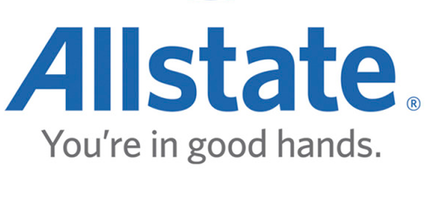

In [1]:
import os
import time
import numpy as np
import pandas as pd
import seaborn as sns
from __future__ import division
from scipy.stats import skew, boxcox
from pandas import DataFrame
from scipy.stats.stats import pearsonr
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import utils
#import skutils
import clone
from IPython.display import Image
from ggplot import *

from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import KFold 
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import ShuffleSplit
from sklearn.cross_validation import StratifiedKFold, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import make_scorer
from sklearn.grid_search import GridSearchCV
from sklearn.grid_search import RandomizedSearchCV
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
#from feature import DropInvariant, CombineLevels, SelectFeature, CreateFeature

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
#import xgboost as xgb
#from xgboost.sklearn import XGBRegressor

import tensorflow as tf
tf.python.control_flow_ops = tf
from keras.models import Sequential
from keras.models import save_model, load_model
from keras.layers.advanced_activations import PReLU
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Activation
from keras.layers import BatchNormalization
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

import io
import requests
url="https://raw.githubusercontent.com/rpwr021/Kaggle_allstate/master/train.csv"
s=requests.get(url).content
DATA=pd.read_csv(io.StringIO(s.decode('utf-8')))
urll="https://raw.githubusercontent.com/rpwr021/Kaggle_allstate/master/test.csv"
ss=requests.get(urll).content
DATADATA=pd.read_csv(io.StringIO(ss.decode('utf-8')))
#DATA = pd.read_csv("C:/Users/jeblanch/Documents/AllState Claim Severity.csv")

pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings('ignore')

import sys
print('Python: {}'.format(sys.version))
import scipy
print('scipy: {}'.format(scipy.__version__))
import numpy
print('numpy: {}'.format(numpy.__version__))
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
import pandas
print('pandas: {}'.format(pandas.__version__))
import sklearn
print('sklearn: {}'.format(sklearn.__version__))
import keras
print('keras: {}'.format(keras.__version__))
import tensorflow
print('tensorflow: {}'.format(tensorflow.__version__))

Image(filename='C:/Users/jeblanch/Documents/picture1.png', width=200)

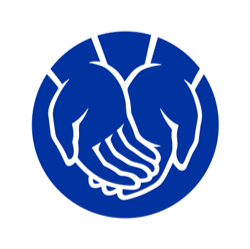

In [19]:
Image(filename='C:/Users/jeblanch/Documents/picture2.png', width=200)

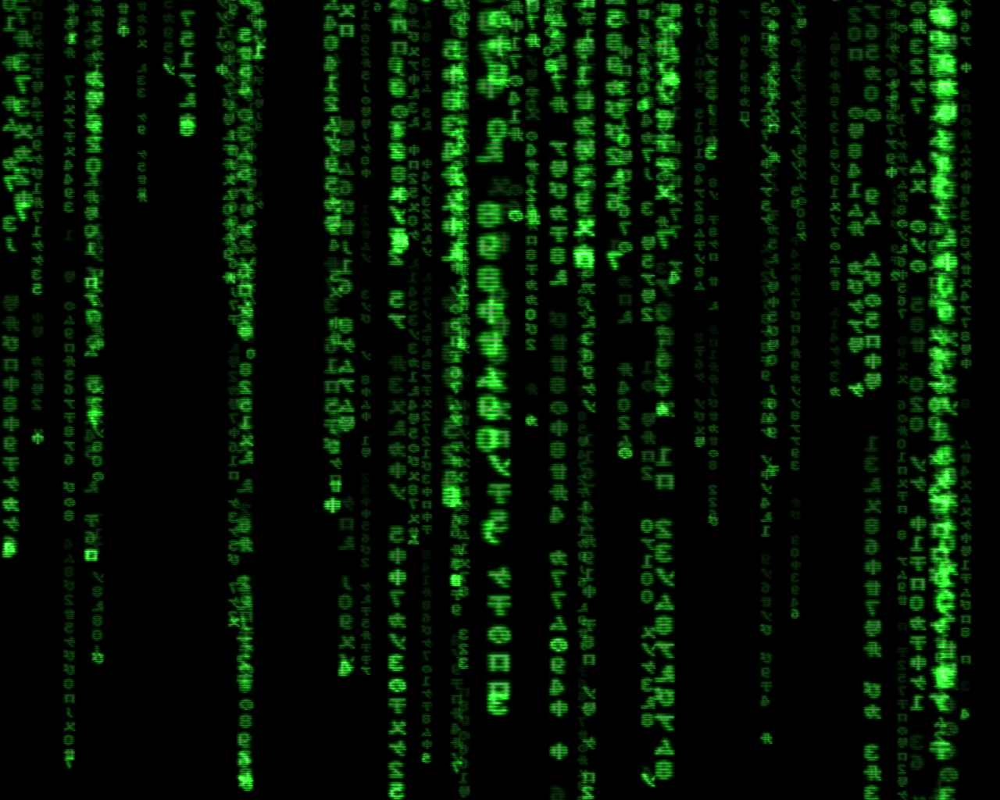

In [35]:
Image(filename='C:/Users/jeblanch/Documents/picture4.PNG', width=300)

# Part 2) Data Description and Interaction

In [3]:
DATA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [18]:
(DATA.dtypes==object).sum()

116

In [22]:
(DATA.dtypes==float).sum()

15

In [14]:
DATA.isnull().values.any()

False

In [4]:
DATA.shape

(188318, 132)

In [5]:
skewed = DATA.loc[:,"cont1":"loss"].apply(lambda x: skew(x))
skewed

cont1     0.516420
cont2    -0.310939
cont3    -0.010002
cont4     0.416093
cont5     0.681617
cont6     0.461211
cont7     0.826046
cont8     0.676629
cont9     1.072420
cont10    0.354998
cont11    0.280819
cont12    0.291990
cont13    0.380739
cont14    0.248672
loss      3.794928
dtype: float64

In [31]:
DATA.columns.values

array(['id', 'cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7',
       'cat8', 'cat9', 'cat10', 'cat11', 'cat12', 'cat13', 'cat14',
       'cat15', 'cat16', 'cat17', 'cat18', 'cat19', 'cat20', 'cat21',
       'cat22', 'cat23', 'cat24', 'cat25', 'cat26', 'cat27', 'cat28',
       'cat29', 'cat30', 'cat31', 'cat32', 'cat33', 'cat34', 'cat35',
       'cat36', 'cat37', 'cat38', 'cat39', 'cat40', 'cat41', 'cat42',
       'cat43', 'cat44', 'cat45', 'cat46', 'cat47', 'cat48', 'cat49',
       'cat50', 'cat51', 'cat52', 'cat53', 'cat54', 'cat55', 'cat56',
       'cat57', 'cat58', 'cat59', 'cat60', 'cat61', 'cat62', 'cat63',
       'cat64', 'cat65', 'cat66', 'cat67', 'cat68', 'cat69', 'cat70',
       'cat71', 'cat72', 'cat73', 'cat74', 'cat75', 'cat76', 'cat77',
       'cat78', 'cat79', 'cat80', 'cat81', 'cat82', 'cat83', 'cat84',
       'cat85', 'cat86', 'cat87', 'cat88', 'cat89', 'cat90', 'cat91',
       'cat92', 'cat93', 'cat94', 'cat95', 'cat96', 'cat97', 'cat98',
       'cat99', 'cat100

In [43]:
colomn_uniques=[]
for col in DATA.iloc[:,1:117]:
    colomn_uniques.append([col,len(DATA[col].unique())])
print(colomn_uniques)

[['cat1', 2], ['cat2', 2], ['cat3', 2], ['cat4', 2], ['cat5', 2], ['cat6', 2], ['cat7', 2], ['cat8', 2], ['cat9', 2], ['cat10', 2], ['cat11', 2], ['cat12', 2], ['cat13', 2], ['cat14', 2], ['cat15', 2], ['cat16', 2], ['cat17', 2], ['cat18', 2], ['cat19', 2], ['cat20', 2], ['cat21', 2], ['cat22', 2], ['cat23', 2], ['cat24', 2], ['cat25', 2], ['cat26', 2], ['cat27', 2], ['cat28', 2], ['cat29', 2], ['cat30', 2], ['cat31', 2], ['cat32', 2], ['cat33', 2], ['cat34', 2], ['cat35', 2], ['cat36', 2], ['cat37', 2], ['cat38', 2], ['cat39', 2], ['cat40', 2], ['cat41', 2], ['cat42', 2], ['cat43', 2], ['cat44', 2], ['cat45', 2], ['cat46', 2], ['cat47', 2], ['cat48', 2], ['cat49', 2], ['cat50', 2], ['cat51', 2], ['cat52', 2], ['cat53', 2], ['cat54', 2], ['cat55', 2], ['cat56', 2], ['cat57', 2], ['cat58', 2], ['cat59', 2], ['cat60', 2], ['cat61', 2], ['cat62', 2], ['cat63', 2], ['cat64', 2], ['cat65', 2], ['cat66', 2], ['cat67', 2], ['cat68', 2], ['cat69', 2], ['cat70', 2], ['cat71', 2], ['cat72', 2], 

In [33]:
VECTOR=[]
for col in DATA.iloc[:,1:117]:
    VECTOR.append(len(DATA[col].unique()))
np.sort(VECTOR)

array([  2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   3,   3,   3,   3,   4,   4,
         4,   4,   4,   4,   4,   4,   4,   4,   4,   4,   5,   5,   5,
         7,   7,   7,   7,   8,   8,   8,   9,  11,  13,  15,  16,  16,
        17,  17,  19,  19,  20,  20,  23,  51,  61,  84, 131, 326])

In [34]:
len(VECTOR)

116

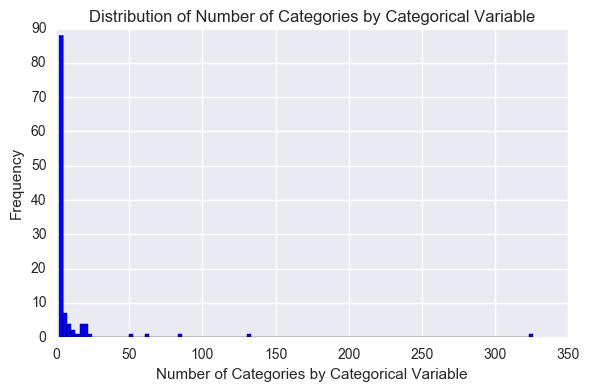

In [38]:
VECTORR = DataFrame(VECTOR)
VECTORR.hist(bins=116, color='b')
plt.xlabel('Number of Categories by Categorical Variable')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Categories by Categorical Variable')
plt.ylim([0,90])
plt.tight_layout()
plt.show()

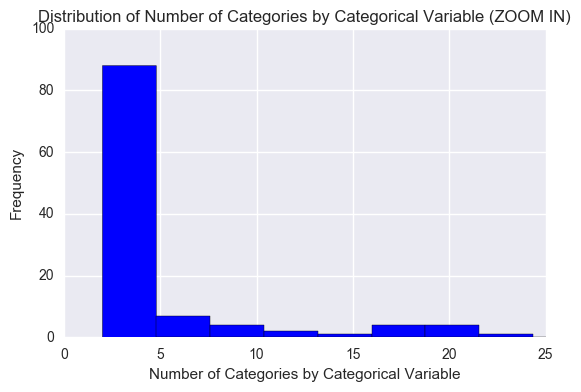

In [36]:
VECTORR = DataFrame(VECTOR)
VECTORR.hist(bins=116, color='b')
plt.xlabel('Number of Categories by Categorical Variable')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Categories by Categorical Variable (ZOOM IN)')
plt.ylim([0,100])
plt.xlim([0,25])
plt.tight_layout()
plt.show()

In [13]:
DATA.head(20)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,A,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,B,D,B,D,C,B,B,B,A,A,A,A,A,D,D,C,E,E,A,D,L,O,A,B,E,F,H,F,A,AB,DK,A,C,AF,A,I,GK,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,D,B,B,D,D,D,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,C,A,A,A,B,H,D,B,D,E,E,A,P,F,J,A,A,D,E,K,G,B,H,C,C,Y,BM,A,K,CK,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85
5,13,A,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,B,A,A,A,A,A,D,D,D,E,C,A,P,J,D,A,A,E,E,H,F,B,BI,CS,A,AS,AE,A,K,DJ,0.546670,0.681761,0.634224,0.373816,0.302678,0.364464,0.401162,0.26847,0.46226,0.50556,0.366788,0.359249,0.345247,0.726792,5142.87
6,14,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,D,C,B,B,B,A,A,A,A,A,D,D,D,E,C,A,P,J,A,A,C,E,E,H,F,B,BI,DK,A,J,AF,A,K,DJ,0.471447,0.737068,0.613660,0.189137,0.295397,0.381515,0.363768,0.24564,0.40455,0.47225,0.334828,0.352251,0.342239,0.382931,1132.22
7,20,A,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,B,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,D,B,D,A,B,C,B,D,C,D,A,A,A,A,C,B,C,E,A,C,T,H,C,A,A,K,F,F,I,G,BI,EB,G,AH,Y,A,P,LO,0.826591,0.488789,0.263570,0.623770,0.473767,0.867021,0.583389,0.90267,0.84847,0.80218,0.644013,0.785706,0.859764,0.242416,3585.75
8,23,A,B,B,B,B,A,A,A,B,B,B,B,B,A,A,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,B,B,B,C,B,D,D,A,A,B,A,A,D,C,C,E,C,D,T,C,Q,A,C,H,F,G,M,K,BI,BC

In [37]:
DATA.describe(include = 'all')

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.000000,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
unique,NaN,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,294135.982561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,169336.084867,NaN,NaN,NaN,NaN,NaN,NaN,

# Continuous Variables

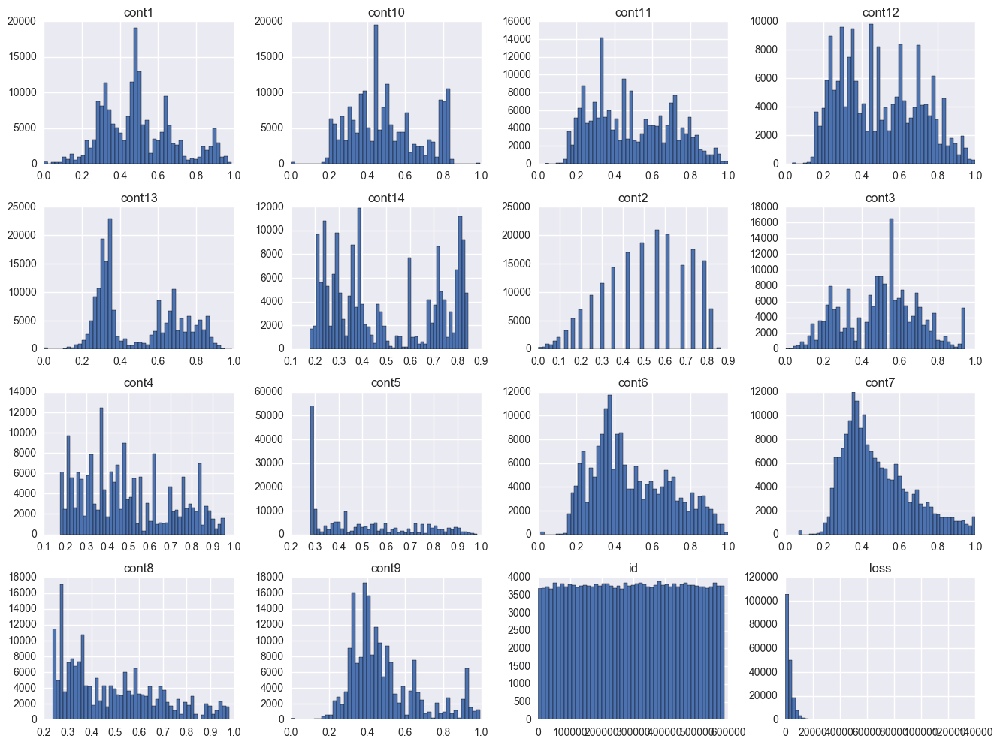

In [44]:
DATA.hist(bins=50, figsize=(16,12));

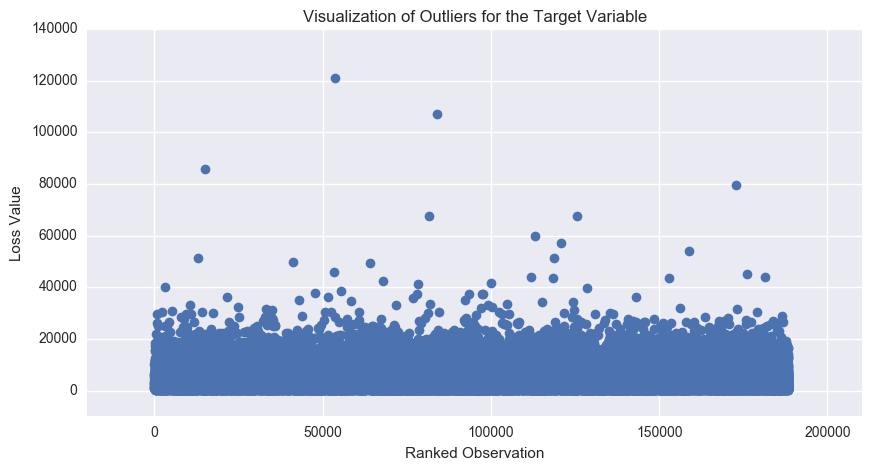

In [47]:
plt.figure(figsize=(10,5))
plt.xlabel('Ranked Observation')
plt.ylabel('Loss Value')
plt.title('Visualization of Outliers for the Target Variable')
plt.xlim([-20000,210318])
plt.ylim([-10000,140000])
plt.plot(DATA.index, DATA["loss"],'o')
plt.show()

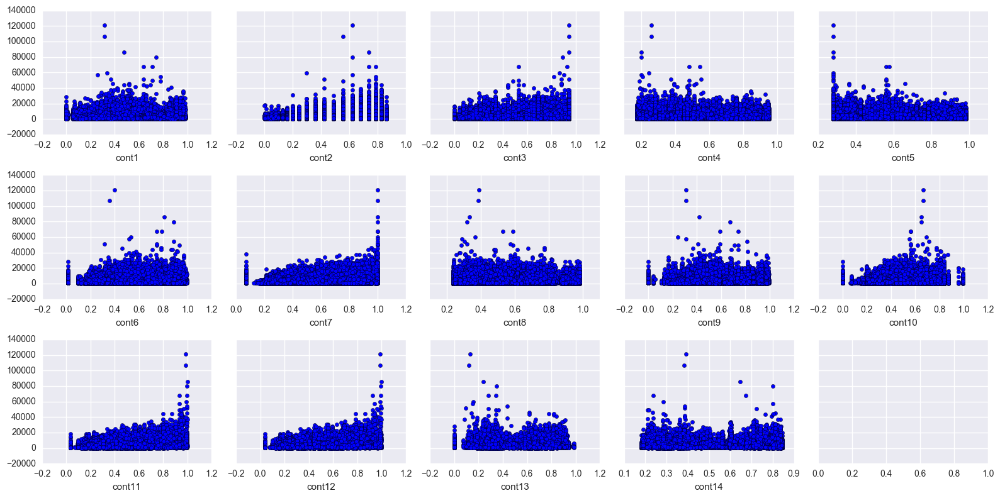

In [54]:
cont_features = [col for col in DATA.columns[1:-1] if 'cont' in col]
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(16, 8), sharey=True)

Ai = 0
Bi = 0

for i in range(0, 14):
    axes[Ai][Bi].scatter(DATA[cont_features[i]], DATA.loss)
    axes[Ai][Bi].set_xlabel(cont_features[i])
    Bi += 1
    if Bi > 4:
        Ai += 1
        Bi = 0
plt.tight_layout();

In [36]:
MC = DATA.iloc[:,117:132].corr()
MC

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
cont1,1.000000,-0.085180,-0.445431,0.367549,-0.025230,0.758315,0.367384,0.361163,0.929912,0.808551,0.596090,0.614225,0.534850,0.056688,-0.010237
cont2,-0.085180,1.000000,0.455861,0.038693,0.191427,0.015864,0.048187,0.137468,-0.032729,0.063526,0.116824,0.106250,0.023335,-0.045584,0.141528
cont3,-0.445431,0.455861,1.000000,-0.341633,0.089417,-0.349278,0.097516,-0.185432,-0.417054,-0.325562,0.025271,0.006111,-0.418203,-0.039592,0.111053
cont4,0.367549,0.038693,-0.341633,1.000000,0.163748,0.220932,-0.115064,0.528740,0.328961,0.283294,0.120927,0.130453,0.179342,0.017445,-0.035831
cont5,-0.025230,0.191427,0.089417,0.163748,1.000000,-0.149810,-0.249344,0.009015,-0.088202,-0.064967,-0.151548,-0.148217,-0.082915,-0.021638,-0.011355
cont6,0.758315,0.015864,-0.349278,0.220932,-0.149810,1.000000,0.658918,0.437437,0.797544,0.883351,0.773745,0.785144,0.815091,0.042178,0.040967
cont7,0.367384,0.048187,0.097516,-0.115064,-0.249344,0.658918,1.000000,0.142042,0.384343,0.492621,0.747108,0.742712,0.288395,0.022286,0.119799
cont8,0.361163,0.137468,-0.185432,0.528740,0.009015,0.437437,0.142042,1.000000,0.452658,0.336588,0.302381,0.315904,0.476402,0.043539,0.030508
cont9,0.929912,-0.032729,-0.417054,0.328961,-0.088202,0.797544,0.384343,0.452658,1.000000,0.785697,0.608000,0.626656,0.642028,0.074154,0.014456
cont10,0.808551,0.063526,-0.325562,0.283294,-0.064967,0.883351,0.492621,0.336588,0.785697,1.000000,0.702896,0.713812,0.707876,0.041808,0.020236


In [28]:
threshold = 0.5
important_corrs = (MC[abs(MC) > threshold][MC != 1.0]) .unstack().dropna().to_dict()
unique_important_corrs = pd.DataFrame(list(set([(tuple(sorted(key)), important_corrs[key]) 
for key in important_corrs])), columns=['feature pair', 'correlation coefficient'])
unique_important_corrs = unique_important_corrs.ix[abs(unique_important_corrs['correlation coefficient']).argsort()[::-1]]
unique_important_corrs

,feature pair,correlation coefficient
12,"(cont11, cont12)",0.994384
1,"(cont1, cont9)",0.929912
22,"(cont10, cont6)",0.883351
6,"(cont13, cont6)",0.815091
4,"(cont1, cont10)",0.808551
16,"(cont6, cont9)",0.797544
8,"(cont10, cont9)",0.785697
2,"(cont12, cont6)",0.785144
7,"(cont11, cont6)",0.773745
13,"(cont1, cont6)",0.758315


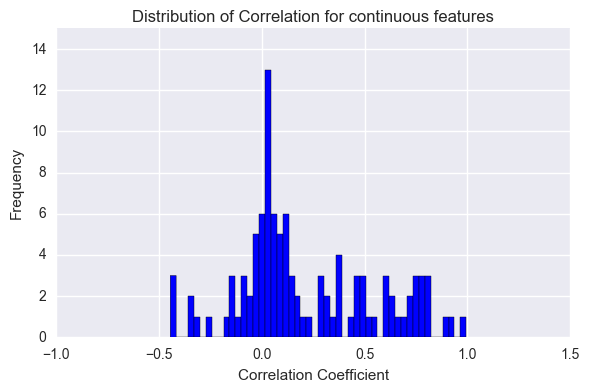

In [29]:
threshold = 0.000
important_corrs = (MC[abs(MC) > threshold][MC != 1.0]) .unstack().dropna().to_dict()
unique_important_corrs = pd.DataFrame(list(set([(tuple(sorted(key)), important_corrs[key]) 
for key in important_corrs])), columns=['feature pair', 'correlation coefficient'])
unique_important_corrs1 = unique_important_corrs.ix[abs(unique_important_corrs['correlation coefficient']).argsort()[::-1]]

unique_important_corrs1.hist(bins=50, color='b')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.ylim([0,15])
plt.xlim([-1,1.5])
plt.title('Distribution of Correlation for continuous features')
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show();

In [54]:
ggg = np.sort(MC.loss).reshape(15,1)
ggg

array([[-0.03583081],
       [-0.0113545 ],
       [-0.01023694],
       [-0.00402211],
       [ 0.01445559],
       [ 0.01929783],
       [ 0.02023614],
       [ 0.03050838],
       [ 0.04096682],
       [ 0.09872385],
       [ 0.09980638],
       [ 0.11105331],
       [ 0.11979887],
       [ 0.14152796],
       [ 1.        ]])

In [55]:
len(ggg)

15

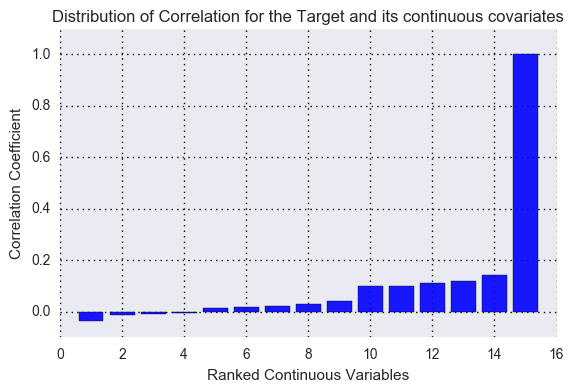

In [66]:
plt.bar(range(1, 16), ggg, alpha=0.9, align='center', color='blue')
#ggg.hist(bins=15, color='b')
plt.xlabel('Ranked Continuous Variables')
plt.ylabel('Correlation Coefficient')
plt.ylim([-0.1,1.1])
#plt.xlim([-1,1])
plt.title('Distribution of Correlation for the Target and its continuous covariates')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.show();

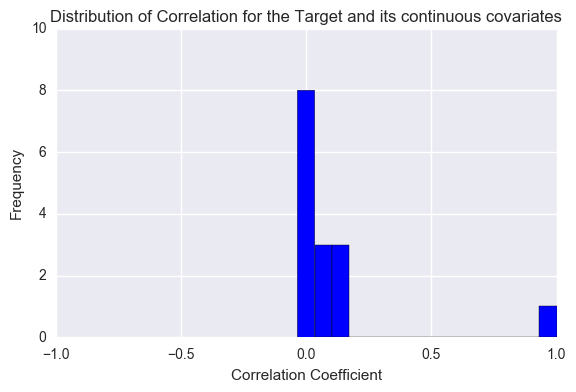

In [30]:
MC.loss.hist(bins=15, color='b')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.ylim([0,10])
plt.xlim([-1,1])
plt.title('Distribution of Correlation for the Target and its continuous covariates')
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show();

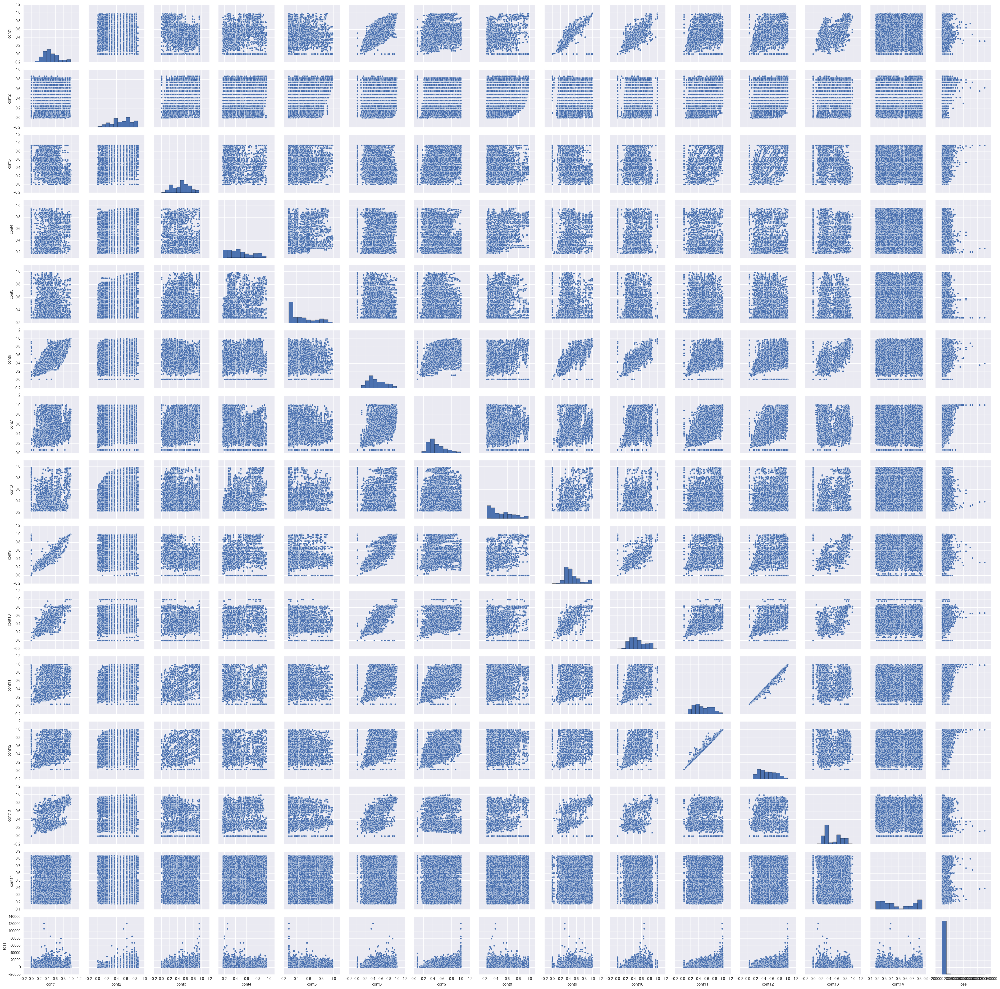

In [60]:
sns.pairplot(DATA, vars=["cont1", "cont2", "cont3", "cont4", "cont5", "cont6", "cont7", "cont8", "cont9", "cont10",
"cont11", "cont12", "cont13", "cont14", "loss"])
plt.show()

### Two cluster of continuous variable are identified

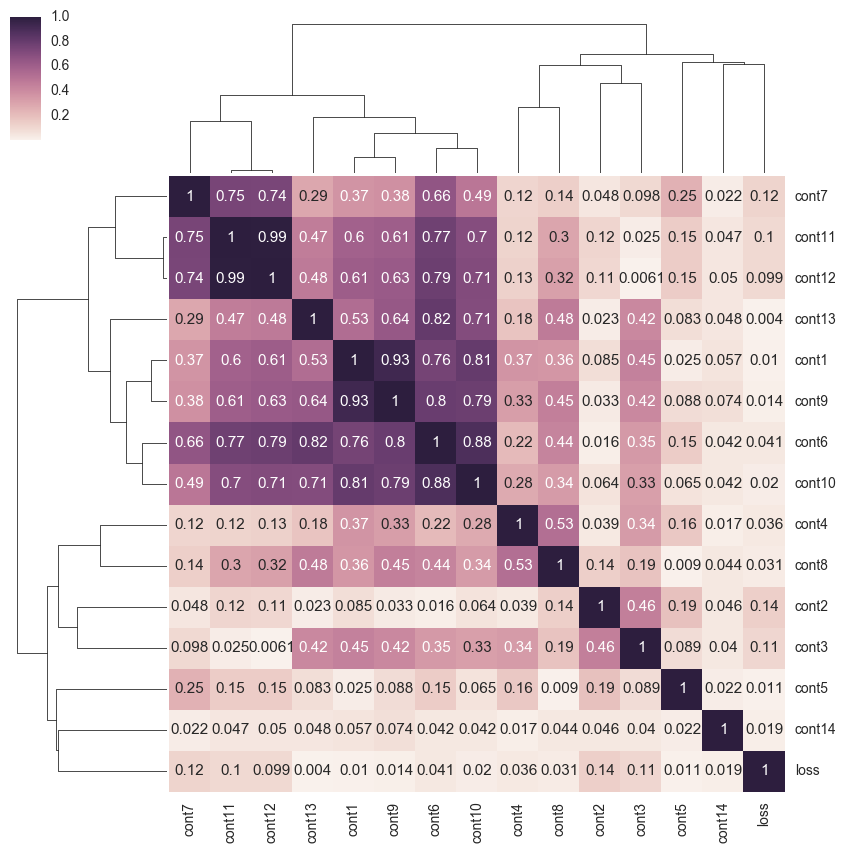

In [52]:
DATA_CONTINUOUS = DATA.iloc[:,117:132]
DATA_CONTINUOUS = DATA_CONTINUOUS.corr().abs()
map = sns.clustermap(DATA_CONTINUOUS, annot = True, annot_kws = {'size': 11})
sns.plt.setp(map.ax_heatmap.yaxis.get_majorticklabels(),rotation = 0)
sns.plt.show()

# Binary Categorical Variables

## Variance

In [2]:
MAXI = []
for col in DATA:
    if DATA[col].dtype == "object" and len(DATA[col].unique()) == 2:
        value_counting = DATA[col].value_counts(normalize=True)
        MAXI.append(value_counting.max())
MAXII = np.sort(MAXI)
MAXII

array([ 0.56670632,  0.60069669,  0.62830956,  0.65706411,  0.68179887,
        0.6993118 ,  0.73073737,  0.75165412,  0.83004811,  0.83605922,
        0.84869742,  0.85075776,  0.88004864,  0.89309572,  0.89343557,
        0.89662698,  0.89913338,  0.90256375,  0.91715078,  0.91838805,
        0.94053144,  0.94135452,  0.94517253,  0.94864007,  0.95119426,
        0.9532015 ,  0.95573445,  0.95646194,  0.96081097,  0.9620801 ,
        0.96561667,  0.96632823,  0.97165433,  0.97384743,  0.9757113 ,
        0.97580688,  0.97702291,  0.97765482,  0.98021963,  0.98110643,
        0.98395268,  0.98790875,  0.9879884 ,  0.99039922,  0.99099927,
        0.99304899,  0.99337822,  0.99356939,  0.99475887,  0.99491817,
        0.99531643,  0.99616606,  0.99627757,  0.99632536,  0.99689886,
        0.99763167,  0.9978069 ,  0.99836978,  0.99840695,  0.99857157,
        0.99873087,  0.99886893,  0.99891673,  0.99903355,  0.99923003,
        0.99924596,  0.9995805 ,  0.99975042,  0.99976104,  0.99

In [6]:
len(MAXI)

72

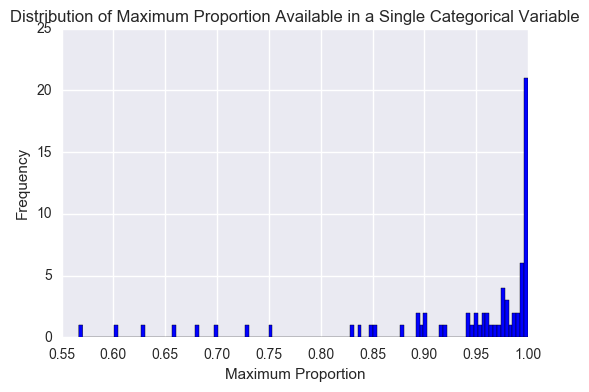

In [56]:
MAXII = DataFrame(MAXI)
MAXII.hist(bins=116, color='b')
plt.xlabel('Maximum Proportion')
plt.ylabel('Frequency')
plt.title('Distribution of Maximum Proportion Available in a Single Categorical Variable')
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show()

In [8]:
MAXII.describe(include = 'all')

,0
count,72.000000
mean,0.930802
std,0.106002
min,0.566706
25%,0.913504
50%,0.976415
75%,0.996469
max,0.999878


## Predictive Potential

In [4]:
VARIANCE = []
dif = []
for col in DATA:
    if DATA[col].dtype == "object" and len(DATA[col].unique()) == 2:
        grouped = DATA['loss'].groupby(DATA[col]).mean()
        dif = np.absolute(grouped['A']-grouped['B'])
        VARIANCE.append(dif)
VARIANCEE = np.sort(VARIANCE)
VARIANCEE

array([   84.00403236,    87.1333461 ,    98.3566689 ,   161.89398671,
         219.66219803,   294.44206558,   347.51984609,   389.12050953,
         399.29427736,   438.68116334,   505.42576009,   517.72273709,
         595.88053718,   604.32483243,   649.36147112,   661.56539384,
         722.13068415,   740.23095079,   814.78062791,   838.35871428,
         841.92390654,   878.26005299,   890.20917763,   893.89819828,
         922.60835399,   938.67083749,  1037.64645865,  1044.78417076,
        1053.43368112,  1159.15334774,  1209.74389267,  1210.29034163,
        1212.34182674,  1233.78397837,  1241.88005093,  1257.13905198,
        1315.61284757,  1316.96729941,  1345.96432694,  1371.50749104,
        1424.67381951,  1462.36156588,  1471.33824653,  1482.30907089,
        1492.89299395,  1524.04937923,  1648.86189456,  1681.86244477,
        1686.36256094,  1696.5163885 ,  1710.40976223,  1741.68032171,
        1781.46944469,  1821.59467607,  1840.88504783,  1941.43796626,
      

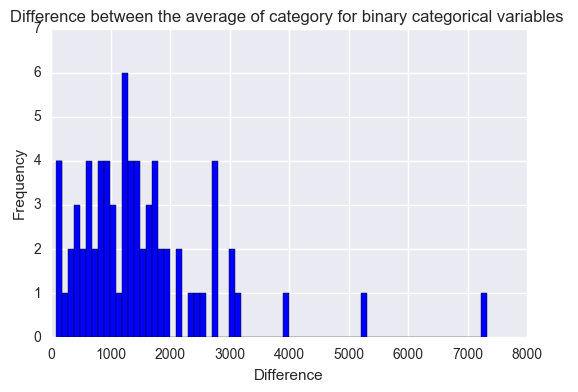

In [55]:
VARIANCEE = DataFrame(VARIANCE)
VARIANCEE.hist(bins=72, color='b')
plt.xlabel('Difference')
plt.ylabel('Frequency')
plt.title('Difference between the average of category for binary categorical variables ')
plt.ylim([0,7])
#plt.xlim([0,25])
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show()

In [38]:
VARIANCEE.describe(include = 'all')

,0
count,72.000000
mean,1502.627090
std,1177.779847
min,84.004032
25%,796.143209
50%,1286.375950
75%,1826.417269
max,7320.098074


In [36]:
len(MAXII) - len(VARIANCEE)

0

## Adding both information on the same graph

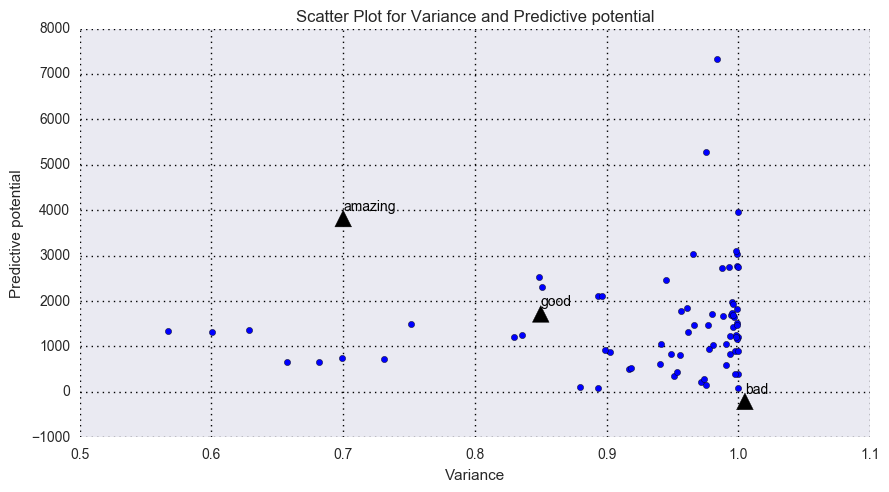

In [40]:
plt.figure(figsize=(9,5), facecolor='white')
plt.scatter(MAXII, VARIANCEE)
plt.xlabel('Variance')
plt.ylabel('Predictive potential')
plt.title('Scatter Plot for Variance and Predictive potential')

plt.annotate('amazing', xy=(0.7, 4000), xytext=(0.7, 4000), 
arrowprops=dict(facecolor='black'), color='black')

plt.annotate('good', xy=(0.85, 1900), xytext=(0.85, 1900), 
arrowprops=dict(facecolor='black'), color='black')

plt.annotate('bad', xy=(1.005, -25), xytext=(1.005, -25), 
arrowprops=dict(facecolor='black'), color='black')

#plt.xlim([0,1])
#plt.ylim([0,1])
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.show();

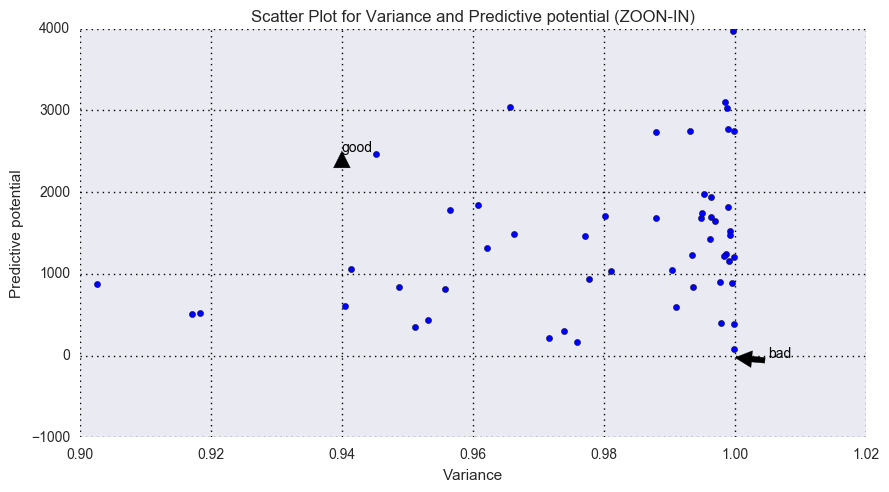

In [41]:
plt.figure(figsize=(9,5), facecolor='white')
plt.scatter(MAXII, VARIANCEE)
plt.xlabel('Variance')
plt.ylabel('Predictive potential')
plt.title('Scatter Plot for Variance and Predictive potential (ZOON-IN)')

plt.annotate('good', xy=(0.94, 2500), xytext=(0.94, 2500), 
arrowprops=dict(facecolor='black'), color='black')

plt.annotate('bad', xy=(1.000, -25), xytext=(1.005, -25), 
arrowprops=dict(facecolor='black'), color='black')

plt.xlim([0.9,1.02])
plt.ylim([-1000,4000])
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.show();

# Categorical Variable with more than 2 Categories

In [2]:
other_cat_features = [col for col in DATA.columns[1:-1] if 'cat' in col and len(DATA[col].unique()) > 2]
len(other_cat_features)

44

In [14]:
MAXIII = []
for col in DATA:
    if DATA[col].dtype == "object" and len(DATA[col].unique()) > 2:
        value_counting = DATA[col].value_counts(normalize=True)
        MAXIII.append(value_counting.max())
MAXIIII = np.sort(MAXIII)
MAXIIII

array([ 0.11183742,  0.13354008,  0.13437377,  0.13907858,  0.22793891,
        0.22817787,  0.23293578,  0.25045402,  0.25122399,  0.34787965,
        0.40619059,  0.41486741,  0.42191931,  0.46480421,  0.55147145,
        0.56018012,  0.56670632,  0.5895772 ,  0.64593932,  0.65706411,
        0.66211939,  0.68179887,  0.6993118 ,  0.73017449,  0.75156915,
        0.78344078,  0.79778354,  0.81202009,  0.81207851,  0.81922599,
        0.81939592,  0.81981011,  0.82275194,  0.88675538,  0.89702524,
        0.92588069,  0.94135452,  0.94517253,  0.96298283,  0.9757113 ,
        0.98095243,  0.98771758,  0.99048418,  0.99567221])

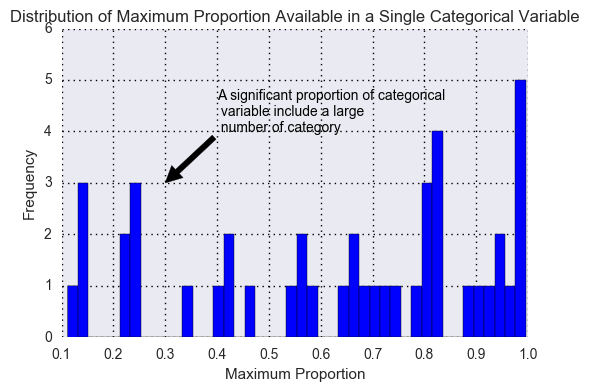

In [25]:
MAXIIII = DataFrame(MAXIIII)
MAXIIII.hist(bins=44, color='b')
plt.xlabel('Maximum Proportion')
plt.ylabel('Frequency')
plt.title('Distribution of Maximum Proportion Available in a Single Categorical Variable')

plt.annotate('A significant proportion of categorical \n variable include a large \n number of category', 
xy=(0.3, 3), xytext=(0.4, 4), arrowprops=dict(facecolor='black'), color='black')

plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.ylim([0,6])
plt.show()

In [17]:
MAXIIII.describe(include = 'all')

,0
count,44.000000
mean,0.632667
std,0.285145
min,0.111837
25%,0.412698
50%,0.690555
75%,0.838753
max,0.995672


# 3) Preprocessing the Data

In [10]:
DATA['log_loss'] = np.log(DATA['loss'])
categorical_covariates = [x for x in DATA.select_dtypes(include=['object']).columns if x not in ['id','loss', 'log_loss']]
numerical_covariates = [x for x in DATA.select_dtypes(exclude=['object']).columns if x not in ['id','loss', 'log_loss']]        
        
print("\n")
print(categorical_covariates)
print("\n")
print(numerical_covariates)



['cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7', 'cat8', 'cat9', 'cat10', 'cat11', 'cat12', 'cat13', 'cat14', 'cat15', 'cat16', 'cat17', 'cat18', 'cat19', 'cat20', 'cat21', 'cat22', 'cat23', 'cat24', 'cat25', 'cat26', 'cat27', 'cat28', 'cat29', 'cat30', 'cat31', 'cat32', 'cat33', 'cat34', 'cat35', 'cat36', 'cat37', 'cat38', 'cat39', 'cat40', 'cat41', 'cat42', 'cat43', 'cat44', 'cat45', 'cat46', 'cat47', 'cat48', 'cat49', 'cat50', 'cat51', 'cat52', 'cat53', 'cat54', 'cat55', 'cat56', 'cat57', 'cat58', 'cat59', 'cat60', 'cat61', 'cat62', 'cat63', 'cat64', 'cat65', 'cat66', 'cat67', 'cat68', 'cat69', 'cat70', 'cat71', 'cat72', 'cat73', 'cat74', 'cat75', 'cat76', 'cat77', 'cat78', 'cat79', 'cat80', 'cat81', 'cat82', 'cat83', 'cat84', 'cat85', 'cat86', 'cat87', 'cat88', 'cat89', 'cat90', 'cat91', 'cat92', 'cat93', 'cat94', 'cat95', 'cat96', 'cat97', 'cat98', 'cat99', 'cat100', 'cat101', 'cat102', 'cat103', 'cat104', 'cat105', 'cat106', 'cat107', 'cat108', 'cat109', 'cat110', 'cat1

In [54]:
DATACAT = DATA[categorical_covariates]
DATANUM = DATA[numerical_covariates]

In [55]:
DATACAT.head(1)

,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116
0,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB


In [66]:
DATANUM.head(1)

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,0.7263,0.245921,0.187583,0.789639,0.310061,0.718367,0.33506,0.3026,0.67135,0.8351,0.569745,0.594646,0.822493,0.714843,2213.18


In [67]:
for x in categorical_covariates:
    lb = LabelEncoder()
    lb.fit(DATA[x].unique())
    DATA[x] = lb.transform(DATA[x])

In [68]:
DATA.head(5)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,1,1,3,3,1,3,2,1,3,1,0,0,0,0,0,3,1,2,4,0,2,15,1,6,0,0,8,4,6,9,6,45,28,2,19,55,0,14,269,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,0,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,11,5,0,0,4,4,8,10,10,33,65,0,22,38,0,14,85,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,0,1,0,0,1,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,1,3,1,3,2,1,1,1,0,0,0,0,0,3,3,2,4,4,0,1,11,14,0,1,4,5,7,5,0,2,85,0,28,5,0,8,153,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,1,1,3,3,3,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,8,3,0,0,4,4,8,10,10,33,67,2,39,4,0,14,79,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,3,1,3,1,1,2,1,1,2,0,0,0,1,5,3,1,3,4,4,0,12,5,9,0,0,3,4,10,6,1,66,50,2,50,38,0,10,55,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


# Part 4) Modelling

In [6]:
seed = 1

trainx = DATA.columns[1:-1]
trainy = DATA.columns[-1]

X = DATA[trainx]
Y = DATA[trainy]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.1, random_state=0)

In [55]:
start_time = time.clock()

print("")
print("")
print("") 
print("List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)")
print("") 

#N_ES = 10
#K = 10

#start_time = time.clock()

#model1 = LinearRegression(n_jobs=-1)
#results1 = cross_val_score(model1, X_train, y_train, cv=K, scoring='mean_squared_error', n_jobs=1)
#print("Linear Regression (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results1.mean(), results1.std()))

#model2 = Ridge(alpha=1,random_state=seed)
#results2 = cross_val_score(model2, X_train, y_train, cv=K, scoring='mean_squared_error', n_jobs=1)
#print("Linear Regression Ridge (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results2.mean(), results2.std()))

#model3 = Lasso(alpha=1,random_state=seed)
#results3 = cross_val_score(model3, X_train, y_train, cv=K, scoring='mean_squared_error', n_jobs=1)
#print("Linear Regression Lasso (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results3.mean(), results3.std()))

#model4 = ElasticNet(alpha=1,random_state=seed)
#results4 = cross_val_score(model4, X_train, y_train, cv=K, scoring='roc_auc', n_jobs=1)
#print("Linear Regression Elastic Net (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results4.mean(), results4.std()))

#model5 = RandomForestRegressor(n_jobs=-1,n_estimators=N_ES, max_features=5, random_state=seed)
#results5 = cross_val_score(model5, X_train, y_train, cv=K, scoring='mean_squared_error', n_jobs=1)
#print("Random Forest (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results5.mean(), results5.std()))





List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)



Work in Progress...
Work in Progress...
Work in Progress...

# ANNEXE